**Nama: Yusuf Fakhri Aldrian**

**NPM 1906351096**

Tugas Pemrograman 4 Datmin

Asdos: Raniah

Referensi:
- https://matplotlib.org/stable/api/cm_api.html
- https://github.com/taynaud/python-louvain
- https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.assortativity.average_degree_connectivity.html
- Beberapa laman networkx.org lainnya dst.

# Download Data

**Tiket Kereta:** 1PL3xp1o5vJ65gGCLXtNUK8wYXzOC4ZY4

**Taman Safari:** 1MWP0_lmN5ziPJ4K33uQV5kadJC3992zU

**Sheila On 7:** 1kfHoGYCitXuXCAq3aYzHfJ-Bm9NwE9Gy

**Jalan yang Jauh Jangan Lupa Pulang:** 1csMr6LJKxRSq60FyrP08ir9ZR1s7dusa

**ChatGPT:** 1CbZLrSCheKbKXrfXTWfWelBynJ1HVU31

In [37]:
# Isi dengan file ID data masing-masing
# Taman Safari
! gdown "1MWP0_lmN5ziPJ4K33uQV5kadJC3992zU"

Downloading...
From: https://drive.google.com/uc?id=1MWP0_lmN5ziPJ4K33uQV5kadJC3992zU
To: /content/taman_safari_recency_tweets.jsonl
100% 13.5M/13.5M [00:00<00:00, 94.3MB/s]


# Install Dependencies and Import Modules

In [38]:
! pip install --upgrade scipy==1.8

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [39]:
! pip install pyvis==0.3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [40]:
! pip install networkx==2.7

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [41]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import json
import random

# Retweet Networks

## Beginning


In [7]:
filename = 'taman_safari_recency_tweets.jsonl'       # Isi dengan nama file data masing-masing
retweet_dict = {}   # Key: (retweeter, retweeted); Value: frekuensi

file_object = open(filename, 'r')
for line in file_object:
    json_object = json.loads(line)
    author_id_mapping = {user['id']: user['username'] for user in json_object['includes']['users']}
    tweet_author_mapping = {tweet['id']: tweet['author_id'] for tweet in json_object['includes']['tweets']}
    for data in json_object['data']:
        retweeter = author_id_mapping.get(data['author_id'], False)
        if retweeter and ('referenced_tweets' in data):
            for tweet in data['referenced_tweets']:
                if tweet['type'] == 'retweeted':
                    retweeted_author_id = tweet_author_mapping.get(tweet['id'], False)
                    if retweeted_author_id:
                        retweeted = author_id_mapping.get(retweeted_author_id, False)
                        if retweeted:
                            pair = (retweeter, retweeted)
                            if pair not in retweet_dict:
                                retweet_dict[pair] = 0
                            retweet_dict[pair] += 1
file_object.close()

In [8]:
retweet_net = nx.DiGraph()
retweet_net.add_weighted_edges_from([(retweeter, retweeted, 1.0) for (retweeter, retweeted) in retweet_dict.keys()])

## Visualisasi

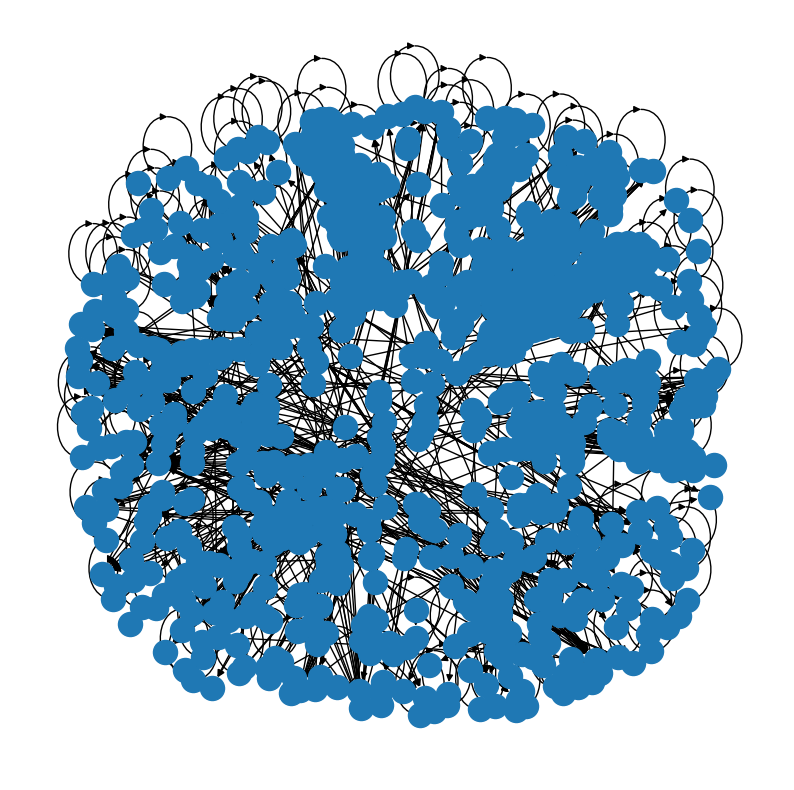

In [9]:
# Visualisasi dengan NetworkX
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
fig, ax = plt.subplots(figsize=(10, 10))
ax.axis("off")
nx.draw_networkx(retweet_net, pos=pos, ax=ax, with_labels=False)

In [10]:
# Visualisasi dengan PyVis
from pyvis.network import Network

nt = Network(height="750px", width="100%", directed=True)
nt.from_nx(retweet_net)
nt.show_buttons(filter_=['physics'])
nt.show('retweet_net.html')

# Download file retweet_net.html, lalu buka di browser

## Basic Topological Attributes

Dokumentasi: 


* https://networkx.org/documentation/stable/reference/functions.html
* https://networkx.org/documentation/stable/reference/algorithms/component.html
* https://networkx.org/documentation/stable/reference/algorithms/shortest_paths.html
* https://networkx.org/documentation/stable/reference/classes/digraph.html

### Jumlah Account (Node)

In [11]:
# Jumlah Node

jml_node =retweet_net.number_of_nodes()

print(retweet_net)
print("Dari melihat jumlah node, jumlah account adalah: ", jml_node)


DiGraph with 1058 nodes and 1312 edges
Dari melihat jumlah node, jumlah account adalah:  1058


### Rata-rata In-Degree

In [12]:
# TODO In Degree

print(retweet_net.in_degree)
print()

sum_indegree = 0
n_indegree = 0

for i,j in retweet_net.in_degree:
  sum_indegree += j
  n_indegree += 1

avg_indegree = sum_indegree / n_indegree
print("Rata-rata In-Degree adalah" , avg_indegree)

[('archerellia', 0), ('nandafnita', 21), ('Ivanfernanda___', 0), ('H451M90', 93), ('soireegurlx', 0), ('andriandinora_', 58), ('sikorbangabut', 0), ('kleunneua', 0), ('Chapel22Holmes', 0), ('angela_syahfira', 35), ('Dendy90799010', 0), ('sihotang_ben', 5), ('exynrt', 0), ('Suara_Rakyat5', 1), ('CindyEeemilia', 2), ('cavimty', 7), ('ifablueblue', 0), ('unicornamjon', 21), ('Info_Nusantara2', 1), ('mitsukind', 0), ('iizunat', 0), ('y0urfriend_', 0), ('iyamrenzia', 156), ('Yooooooo28', 0), ('grumpybitj', 5), ('SamaIla29939119', 0), ('fery79197164', 1), ('IrmaliaRompas', 1), ('ekcpta1998', 0), ('aghval', 0), ('kentankkgirl', 0), ('sgitsp', 5), ('janebabydoee', 0), ('letsgooo67', 15), ('sapasiap', 0), ('merahputihsuara', 1), ('RizaldinRizald2', 0), ('ratnasari917', 30), ('dienissaau', 0), ('and1wen', 5), ('MarioGu25986384', 0), ('hasanahmil', 15), ('nikchitta', 0), ('abellelel', 0), ('drunkhys', 0), ('DewiGibran3', 1), ('FauziWiraa', 1), ('bysuryaa', 0), ('ZaraEmiliaaa', 1), ('fierterose_',

### Rata-rata Out-Degree

In [13]:
# TODO Out Degree

print(retweet_net.out_degree)
print()

sum_outdegree = 0
n_outdegree  = 0

for i,j in retweet_net.out_degree:
  sum_outdegree += j
  n_outdegree += 1

avg_outdegree = sum_outdegree / n_outdegree
print("Rata-rata Out-Degree adalah" , avg_outdegree)

[('archerellia', 1), ('nandafnita', 0), ('Ivanfernanda___', 1), ('H451M90', 0), ('soireegurlx', 1), ('andriandinora_', 0), ('sikorbangabut', 1), ('kleunneua', 1), ('Chapel22Holmes', 1), ('angela_syahfira', 0), ('Dendy90799010', 1), ('sihotang_ben', 0), ('exynrt', 1), ('Suara_Rakyat5', 1), ('CindyEeemilia', 1), ('cavimty', 1), ('ifablueblue', 1), ('unicornamjon', 0), ('Info_Nusantara2', 1), ('mitsukind', 1), ('iizunat', 1), ('y0urfriend_', 1), ('iyamrenzia', 0), ('Yooooooo28', 1), ('grumpybitj', 0), ('SamaIla29939119', 1), ('fery79197164', 0), ('IrmaliaRompas', 1), ('ekcpta1998', 2), ('aghval', 1), ('kentankkgirl', 1), ('sgitsp', 0), ('janebabydoee', 1), ('letsgooo67', 0), ('sapasiap', 1), ('merahputihsuara', 0), ('RizaldinRizald2', 1), ('ratnasari917', 0), ('dienissaau', 2), ('and1wen', 0), ('MarioGu25986384', 2), ('hasanahmil', 0), ('nikchitta', 1), ('abellelel', 1), ('drunkhys', 1), ('DewiGibran3', 1), ('FauziWiraa', 1), ('bysuryaa', 1), ('ZaraEmiliaaa', 1), ('fierterose_', 1), ('git

### Density

In [14]:
# TODO Density

print("Density dari graph adalah" , nx.density(retweet_net))

Density dari graph adalah 0.0011732030410281265


### Jumlah Connected Components

In [15]:
# TODO Con. Comp.
sum_cc = 0
#for c in sorted(nx.connected_components(retweet_net), key=len, reverse=True):
#for c in nx.connected_components(retweet_net.to_undirected()):

for c in nx.connected_components(retweet_net.to_undirected()):
  sum_cc += 1

print("Jumlah Connected Components adalah" , nx.number_connected_components(retweet_net.to_undirected()))

#print("Jumlah Connected Components adalah" , [len(c) for c in sorted(nx.connected_components(retweet_net), key=len, reverse=True)]) 

Jumlah Connected Components adalah 166


### Jumlah Strongly Connected Components (SCC)

In [16]:
# TODO SCC

sum_scc = 0
for i in nx.strongly_connected_components(retweet_net):
  sum_scc += 1

print("Jumlah Strongly Connected Components adalah" , sum_scc)

Jumlah Strongly Connected Components adalah 1049


### Apabila network yang terbentuk diubah menjadi undirected, apakah network tersebut merupakan connected graph?

In [17]:
# TODO ke undirect. apakh connected

retweet_net_undirected = retweet_net.to_undirected()
print("")
print("Apakah connected graph?", nx.is_connected(retweet_net_undirected))


Apakah connected graph? False


### Average Path Length

In [18]:
# TODO Average Path Length

#print(nx.average_shortest_path_length(retweet_net))
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(retweet_net))

sum_apl = 0
jmlh_apl = 0

for i in shortest_path_lengths.values():
  #print(i)
  for j in i.values():
    sum_apl += j
    jmlh_apl +=1
  
print("Average Path Length:", sum_apl/jmlh_apl)


Average Path Length: 0.5630728939327805


## Centrality

Dokumentasi: https://networkx.org/documentation/stable/reference/algorithms/centrality.html

### Degree Centrality

#### In-Degree Centrality

In [19]:
# Cari top-10 account dengan in-degree centrality tertinggi
in_degree_centrality = nx.centrality.in_degree_centrality(retweet_net)
sorted(in_degree_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('iyamrenzia', 0.14758751182592242),
 ('H451M90', 0.0879848628192999),
 ('andriandinora_', 0.05487228003784295),
 ('anto_cahaya', 0.04162724692526017),
 ('angela_syahfira', 0.033112582781456956),
 ('ratnasari917', 0.028382213812677387),
 ('bunnystasty', 0.02270577105014191),
 ('sobatshopii', 0.02270577105014191),
 ('nandafnita', 0.019867549668874173),
 ('unicornamjon', 0.019867549668874173)]

(-1.167588250041008,
 1.0226569336652755,
 -1.1959779187572468,
 1.1115097498080948)

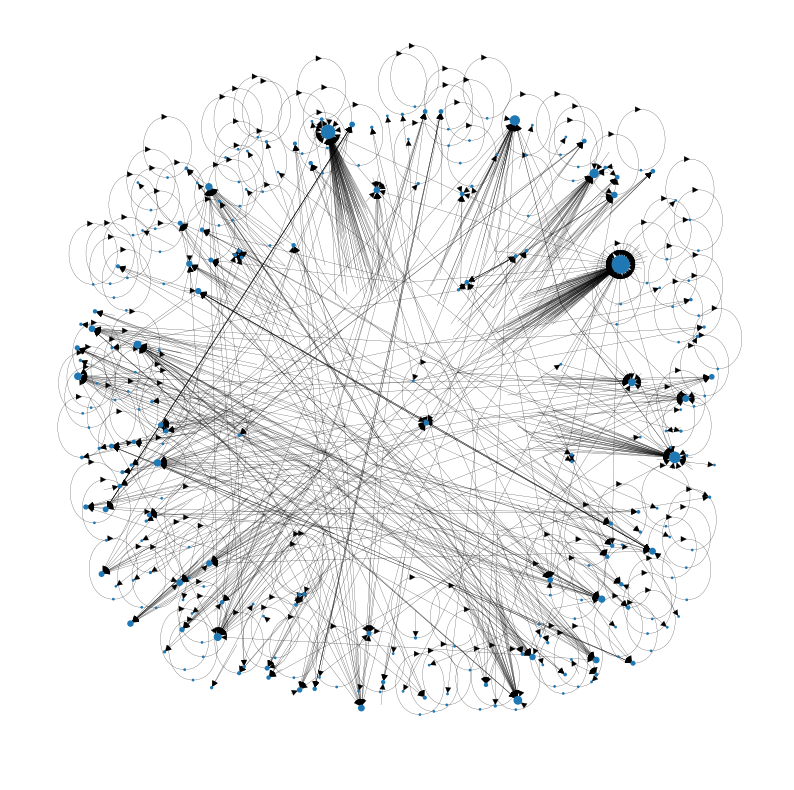

In [20]:
# Visualisasi in-degree centrality - NetworkX
node_size = [v * 1000 for v in in_degree_centrality.values()]
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(retweet_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [21]:
# Visualisasi in-degree centrality - PyVis
nt = Network(height = "750px", width = "100%", directed = True)
MULTIPLIER_FACTOR = 100

# Pengubahan property size dan color harus dilakukan secara manual
for node in retweet_net.nodes():
  nt.add_node(node, size=in_degree_centrality[node] * MULTIPLIER_FACTOR)

for source, target in retweet_net.edges():
  nt.add_edge(source, target)

nt.show_buttons(filter_=['physics'])
nt.show('retweet_net_in_deg_centrality.html')

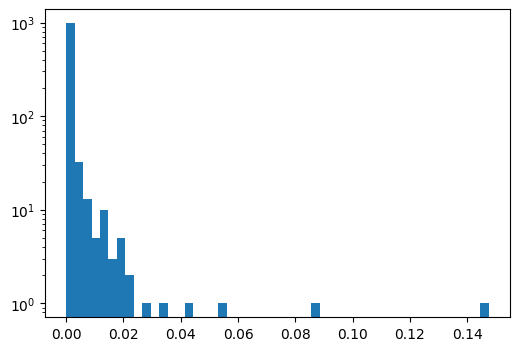

In [22]:
# In-Degree Distribution
plt.figure(figsize=(6, 4))
plt.hist(in_degree_centrality.values(), bins=50)
plt.yscale('log')

#### Out-Degree Centrality

In [23]:
# TODO: Cari top-10 account dengan out-degree centrality tertinggi
out_degree_centrality = nx.centrality.out_degree_centrality(retweet_net)
sorted(out_degree_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('gorgeouschan', 0.015137180700094607),
 ('Redvelcake_', 0.014191106906338694),
 ('spaceeby', 0.014191106906338694),
 ('qiustuff', 0.011352885525070956),
 ('rotitawardouble', 0.011352885525070956),
 ('resaaaa_18', 0.010406811731315042),
 ('veeyaww', 0.008514664143803218),
 ('tmkoyaki', 0.008514664143803218),
 ('daisychain09', 0.008514664143803218),
 ('itszeeezz', 0.007568590350047304)]

(-1.167588250041008,
 1.0226569336652755,
 -1.1959779187572468,
 1.1115097498080948)

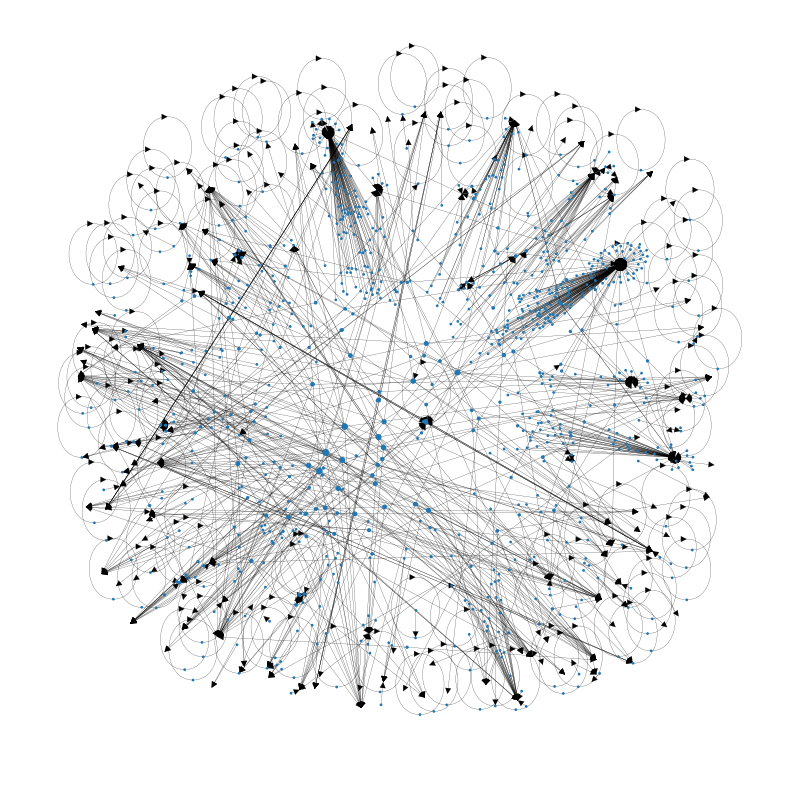

In [24]:
# TODO: Visualisasi out-degree centrality dengan NetworkX
node_size = [v * 1000 for v in out_degree_centrality.values()]
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(retweet_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Eigenvector Centrality

In [25]:
# TODO: Cari top-10 account dengan eigenvector centrality tertinggi
eigenv_centrality = nx.centrality.eigenvector_centrality(retweet_net)
sorted(eigenv_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('cutiesdrummer', 0.5773500766853422),
 ('duosinggit', 0.5773500766853422),
 ('manyunmelulu', 0.5773500766853422),
 ('Pelanggang', 0.0003711757804354438),
 ('azoreellaa', 0.0003711757804354167),
 ('KeysaDita2', 0.0002783818353265862),
 ('Fizah_Indah', 0.00027838183532655913),
 ('coznical', 0.00019332628416306622),
 ('adjusthings', 0.0001933207189768074),
 ('opiniums', 0.00019332071897676685)]

(-1.167588250041008,
 1.0226569336652755,
 -1.1959779187572468,
 1.1115097498080948)

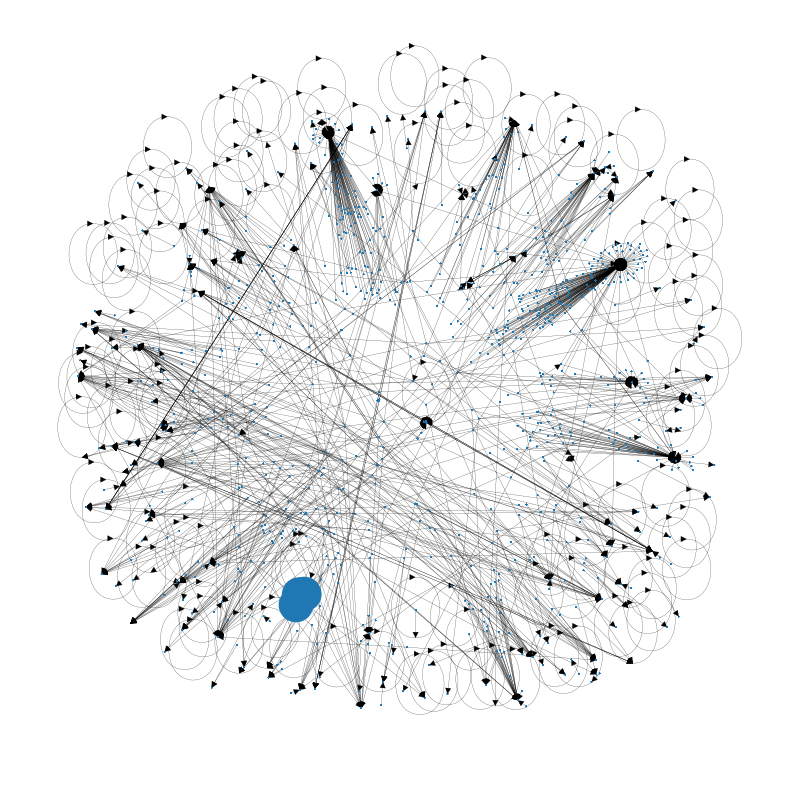

In [26]:
# TODO: Visualisasi eigenvector centrality dengan NetworkX
node_size = [v * 1000 for v in eigenv_centrality.values()]
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(retweet_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Betweenness Centrality

In [27]:
# TODO: Cari top-10 account dengan betweenness centrality tertinggi
btwns_centrality = nx.centrality.betweenness_centrality(retweet_net)
sorted(btwns_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('adjusthings', 1.1198790172300106e-05),
 ('shopeesticated_', 1.0750838565408102e-05),
 ('kinarration', 5.375419282704051e-06),
 ('zahira_kalyna', 3.583612855136034e-06),
 ('tmkoyaki', 2.6877096413520255e-06),
 ('directolr', 2.6877096413520255e-06),
 ('siska_larass', 2.2397580344600212e-06),
 ('opiniums', 2.2397580344600212e-06),
 ('Pelanggang', 1.791806427568017e-06),
 ('Cvkdomo', 1.791806427568017e-06)]

(-1.167588250041008,
 1.0226569336652755,
 -1.1959779187572468,
 1.1115097498080948)

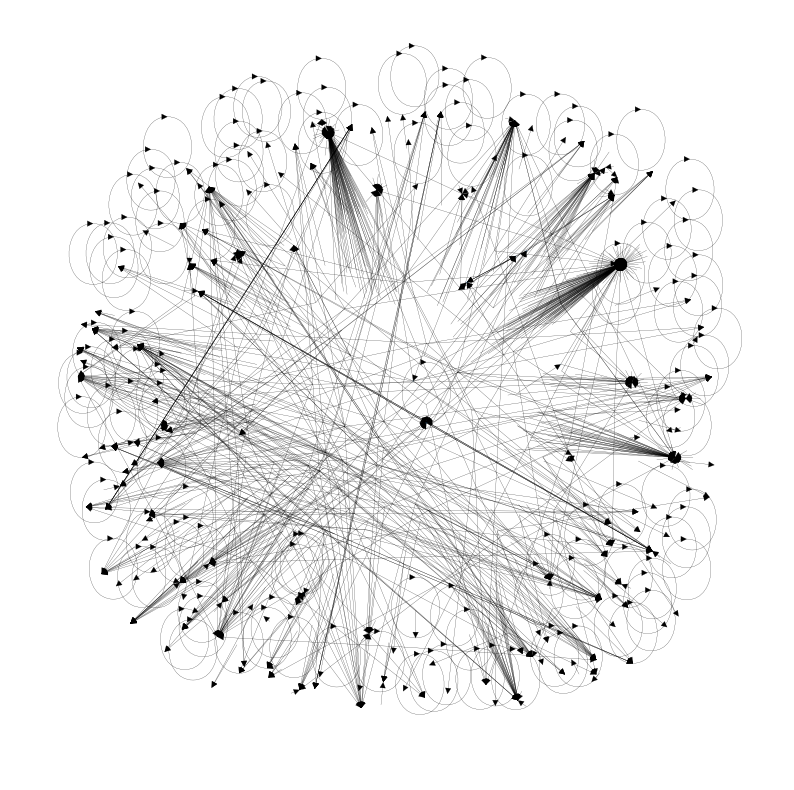

In [28]:
# TODO: Visualisasi betweenness centrality dengan NetworkX
node_size = [v * 1000 for v in btwns_centrality.values()]
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(retweet_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Closeness Centrality

In [29]:
# TODO: Cari top-10 account dengan closeness centrality tertinggi
closeness_centrality = nx.centrality.closeness_centrality(retweet_net)
sorted(closeness_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('iyamrenzia', 0.14759349963474366),
 ('H451M90', 0.0879848628192999),
 ('andriandinora_', 0.05487228003784295),
 ('anto_cahaya', 0.041627246925260174),
 ('angela_syahfira', 0.033112582781456956),
 ('ratnasari917', 0.02838221381267739),
 ('bunnystasty', 0.02270577105014191),
 ('sobatshopii', 0.02270577105014191),
 ('nandafnita', 0.019867549668874173),
 ('unicornamjon', 0.019867549668874173)]

(-1.167588250041008,
 1.0226569336652755,
 -1.1959779187572468,
 1.1115097498080948)

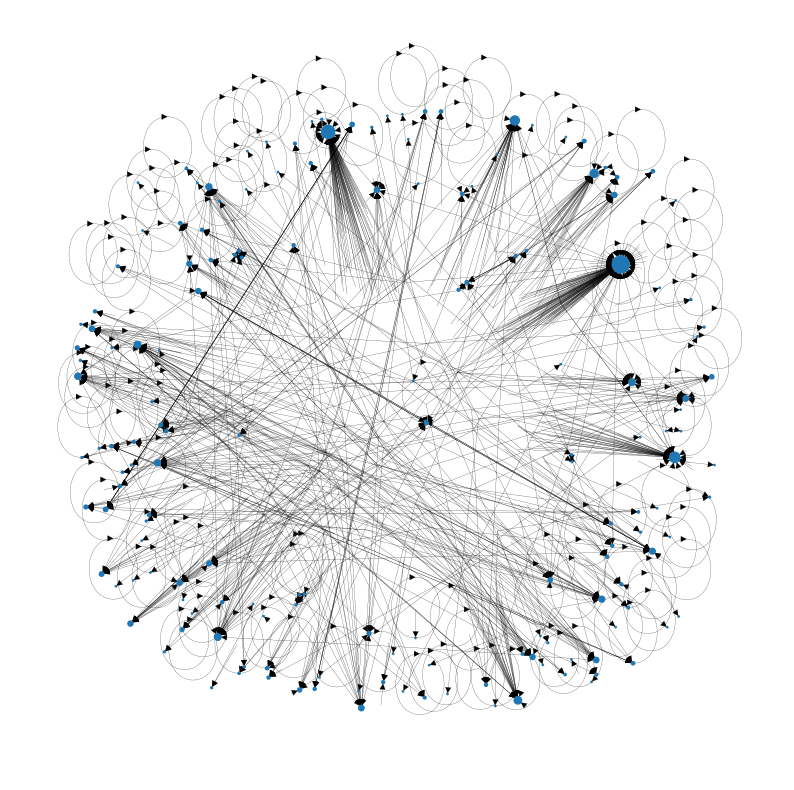

In [30]:
# TODO: Visualisasi closeness centrality dengan NetworkX
node_size = [v * 1000 for v in closeness_centrality.values()]
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(retweet_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Community Detection

Dokumentasi: https://networkx.org/documentation/stable/reference/algorithms/community.html

### Greedy Modularity

In [31]:
nodes = {node: i for i, node in enumerate(retweet_net.nodes())}
colors = ["" for x in range(retweet_net.number_of_nodes())]

counter = 0
for com in nx.community.greedy_modularity_communities(retweet_net):
    color = "#%06X" % random.randint(0, 0xFFFFFF)
    counter += 1
    for node in list(com):
        colors[nodes[node]] = color

print('Number of Community using Greedy Modularity: {}'.format(counter))

Number of Community using Greedy Modularity: 179


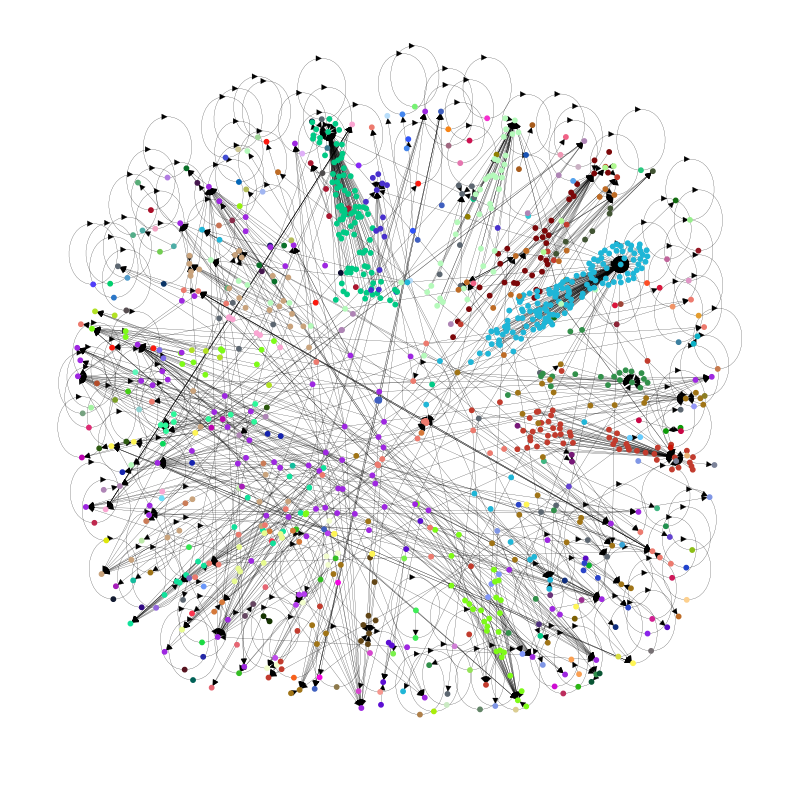

In [32]:
# Visualisasi community dengan NetworkX
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize = (10, 10))
plt.axis("off")
nx.draw_networkx(retweet_net, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=colors)

### Louvain

In [33]:
! pip install python-louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [34]:
from community import community_louvain

In [35]:
# TODO: Cari jumlah community apabila menggunakan Louvain

#Tidak pakai ini karena sgt lama
commented_code = '''
nodes = {node: i for i, node in enumerate(retweet_net.nodes())}
colors = ["" for x in range(retweet_net.number_of_nodes())]

counter = 0
for com in nx.community.louvain_communities(retweet_net):
    color = "#%06X" % random.randint(0, 0xFFFFFF)
    counter += 1
    for node in list(com):
        colors[nodes[node]] = color

print('Number of Community Louvain: {}'.format(counter)) 
'''


In [102]:
# TODO: Cari jumlah community apabila menggunakan Louvain
G = retweet_net.to_undirected()
partition = community_louvain.best_partition(G)

counter = 0
for i in partition:
  if partition[i] != 0:
    counter += 1

print('Number of Community using Label Propagation: {}'.format(counter))

Number of Community using Label Propagation: 1024


<ipython-input-54-da2518aedc20>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)


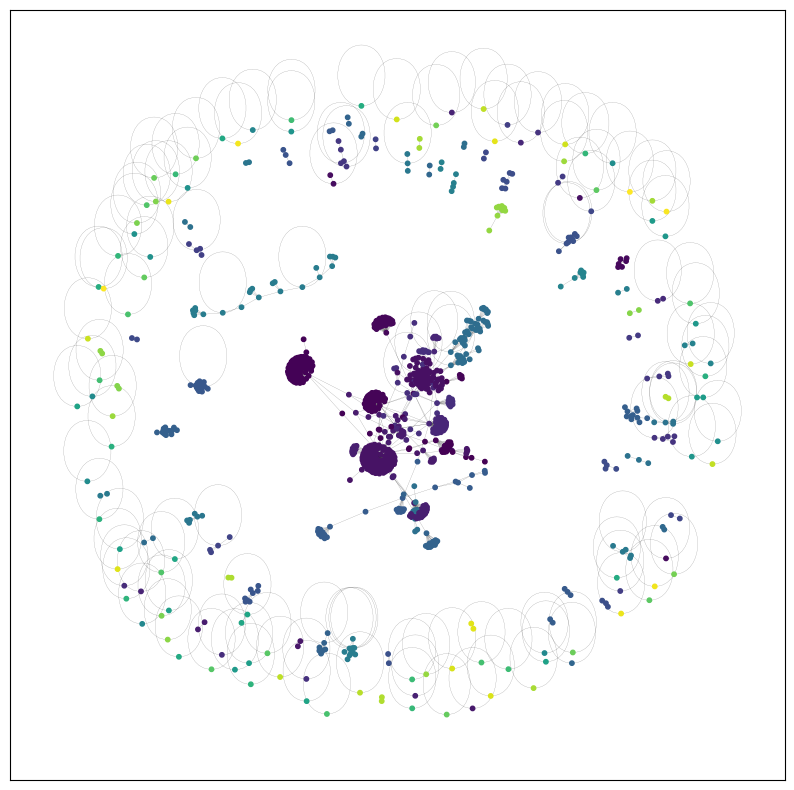

In [54]:
# TODO: Visualisasi community hasil Louvain dengan NetworkX
# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
plt.figure(figsize = (10, 10))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=10,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5, width=0.15)
plt.show()


### Label Propagation

In [53]:
# TODO: Cari jumlah community apabila menggunakan Louvain
# Catatan: Algoritma label propagation tidak bisa diterapkan untuk directed graph
retweet_net_undirected = retweet_net.to_undirected()
nodes = {node: i for i, node in enumerate(retweet_net_undirected)}
colors = ["" for x in range(retweet_net.number_of_nodes())]

counter = 0
for com in nx.community.label_propagation_communities(retweet_net_undirected):
    color = "#%06X" % random.randint(0, 0xFFFFFF)
    counter += 1
    for node in list(com):
        colors[nodes[node]] = color

print('Number of Community using Label Propagation: {}'.format(counter))

Number of Community using Label Propagation: 217


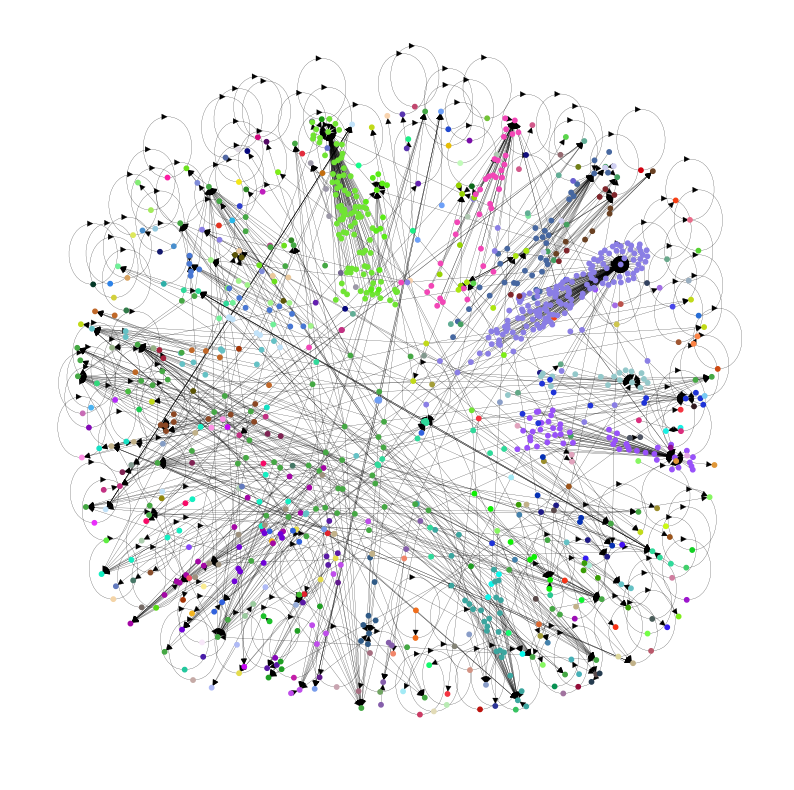

In [48]:
# TODO: Visualisasi community hasil Label Propagation dengan NetworkX

# Visualisasi community dengan NetworkX
pos = nx.spring_layout(retweet_net, iterations=20, seed=0)
plt.figure(figsize = (10, 10))
plt.axis("off")
nx.draw_networkx(retweet_net, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=colors)

# Mention Networks

Serupa dengan retweet networks, lakukan hal-hal berikut terhadap mention networks:

1. Visualisasikan network yang terbentuk
2. Cari tahu atribut-atribut berikut:
    * Jumlah node
    * Rata-rata in-degree dan out-degree
    * Density
    * Jumlah connected components dan strongly connected components
    * Connectivity dari graph apabila network diubah menjadi undirected
    * Average path length
3. Cari top-10 account dengan centrality tertinggi berdasarkan kriteria-kriteria berikut:
    * In-degree dan out-degree
    * Eigenvector
    * Betweenness
    * Closeness
4. Lakukan community detection berdasarkan metode-metode berikut dan visualisasikan hasilnya:
    * Greedy Modularity
    * Louvain
    * Label Propagation





## Beginning

In [55]:
filename = 'taman_safari_recency_tweets.jsonl'       # Isi dengan nama file data masing-masing
mention_dict = {}   # Key: (mentioner, mentioned); Value: frekuensi

file_object = open(filename, 'r')
for line in file_object:
    json_object = json.loads(line)
    author_id_mapping = {user['id']: user['username'] for user in json_object['includes']['users']}
    for data in json_object['data']:
        mentioner = author_id_mapping.get(data['author_id'], False)
        if mentioner and ('entities' in data):
            if 'mentions' in data['entities']:
                for user in data['entities']['mentions']:
                    mentioned = user['username']
                    pair = (mentioner, mentioned)
                    if pair not in mention_dict:
                        mention_dict[pair] = 0
                    mention_dict[pair] += 1
file_object.close()

In [56]:
mention_net = nx.DiGraph()
mention_net.add_weighted_edges_from([(mentioner, mentioned, 1.0) for (mentioner, mentioned) in mention_dict.keys()])

## Visualisasi

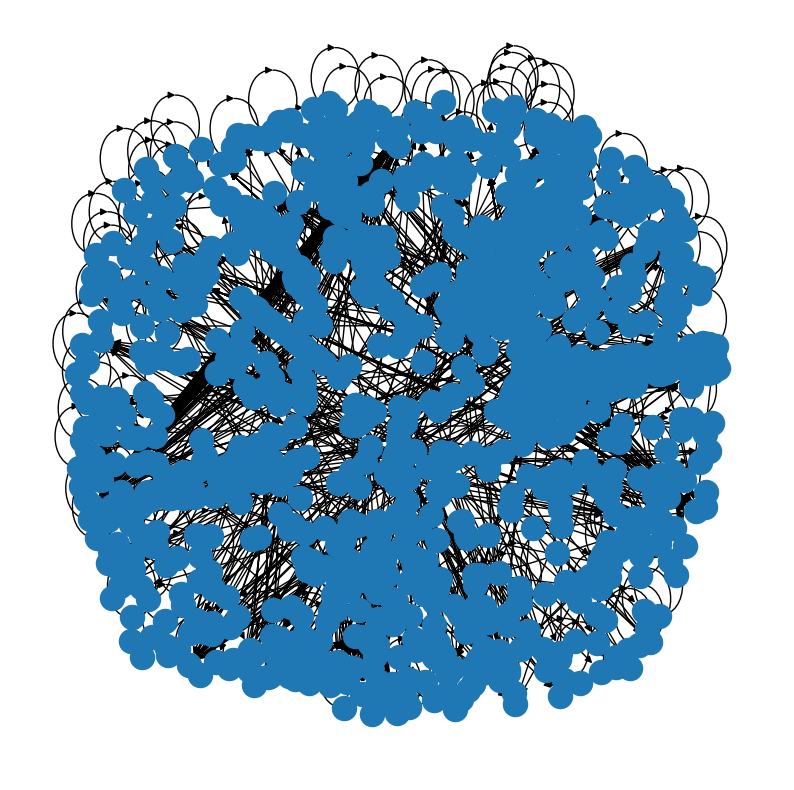

In [57]:
# Visualisasi dengan NetworkX
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
fig, ax = plt.subplots(figsize=(10, 10))
ax.axis("off")
nx.draw_networkx(mention_net, pos=pos, ax=ax, with_labels=False)

In [58]:
# Visualisasi dengan PyVis
from pyvis.network import Network

nt = Network(height="750px", width="100%", directed=True)
nt.from_nx(retweet_net)
nt.show_buttons(filter_=['physics'])
nt.show('mention_net.html')

# Download file mention_net.html, lalu buka di browser

## Basic Topological Attributes

Dokumentasi: 


* https://networkx.org/documentation/stable/reference/functions.html
* https://networkx.org/documentation/stable/reference/algorithms/component.html
* https://networkx.org/documentation/stable/reference/algorithms/shortest_paths.html
* https://networkx.org/documentation/stable/reference/classes/digraph.html

### Jumlah Account (Node)

In [59]:
# Jumlah Node

jml_node = mention_net.number_of_nodes()

print(mention_net)
print("Dari melihat jumlah node, jumlah account adalah: ", jml_node)


DiGraph with 1270 nodes and 1795 edges
Dari melihat jumlah node, jumlah account adalah:  1270


### Rata-rata In-Degree

In [60]:
# TODO In Degree

print(mention_net.in_degree)
print()

sum_indegree = 0
n_indegree = 0

for i,j in mention_net.in_degree:
  sum_indegree += j
  n_indegree += 1

avg_indegree = sum_indegree / n_indegree
print("Rata-rata In-Degree adalah" , avg_indegree)

[('archerellia', 0), ('nandafnita', 21), ('snorlaxzs', 36), ('goenrock', 21), ('Askrlfess', 72), ('Ivanfernanda___', 0), ('H451M90', 93), ('febrian_pepe', 139), ('soireegurlx', 0), ('andriandinora_', 58), ('galamaizee', 0), ('YouTube', 1), ('sikorbangabut', 0), ('kleunneua', 0), ('akudansegala', 0), ('Chapel22Holmes', 0), ('angela_syahfira', 35), ('Dendy90799010', 0), ('sihotang_ben', 5), ('exynrt', 0), ('djenovaa', 0), ('tvOneNews', 8), ('Suara_Rakyat5', 1), ('Nugroho_Hami', 0), ('INDA_B0Y', 1), ('CindyEeemilia', 2), ('d__han77', 0), ('tanyakanrl', 7), ('chococreamy0', 1), ('cavimty', 7), ('ifablueblue', 0), ('unicornamjon', 21), ('Info_Nusantara2', 1), ('mitsukind', 0), ('iizunat', 0), ('y0urfriend_', 0), ('iyamrenzia', 157), ('Yooooooo28', 0), ('grumpybitj', 5), ('milarianbagja', 5), ('SamaIla29939119', 0), ('fery79197164', 1), ('YaqutCQoumas', 2), ('IrmaliaRompas', 1), ('ekcpta1998', 0), ('aghval', 0), ('kentankkgirl', 0), ('sgitsp', 5), ('janebabydoee', 0), ('letsgooo67', 15), ('s

### Rata-rata Out-Degree

In [61]:
# TODO Out Degree

print(mention_net.out_degree)
print()

sum_outdegree = 0
n_outdegree  = 0

for i,j in mention_net.out_degree:
  sum_outdegree += j
  n_outdegree += 1

avg_outdegree = sum_outdegree / n_outdegree
print("Rata-rata Out-Degree adalah" , avg_outdegree)

[('archerellia', 4), ('nandafnita', 0), ('snorlaxzs', 0), ('goenrock', 0), ('Askrlfess', 0), ('Ivanfernanda___', 2), ('H451M90', 0), ('febrian_pepe', 1), ('soireegurlx', 1), ('andriandinora_', 0), ('galamaizee', 1), ('YouTube', 0), ('sikorbangabut', 2), ('kleunneua', 1), ('akudansegala', 1), ('Chapel22Holmes', 1), ('angela_syahfira', 0), ('Dendy90799010', 1), ('sihotang_ben', 0), ('exynrt', 1), ('djenovaa', 1), ('tvOneNews', 0), ('Suara_Rakyat5', 1), ('Nugroho_Hami', 1), ('INDA_B0Y', 3), ('CindyEeemilia', 1), ('d__han77', 2), ('tanyakanrl', 0), ('chococreamy0', 0), ('cavimty', 1), ('ifablueblue', 1), ('unicornamjon', 0), ('Info_Nusantara2', 1), ('mitsukind', 2), ('iizunat', 2), ('y0urfriend_', 1), ('iyamrenzia', 0), ('Yooooooo28', 3), ('grumpybitj', 0), ('milarianbagja', 0), ('SamaIla29939119', 2), ('fery79197164', 1), ('YaqutCQoumas', 0), ('IrmaliaRompas', 1), ('ekcpta1998', 5), ('aghval', 1), ('kentankkgirl', 2), ('sgitsp', 1), ('janebabydoee', 1), ('letsgooo67', 0), ('sapasiap', 1),

### Density

In [62]:
# TODO Density

print("Density dari graph adalah" , nx.density(mention_net))

Density dari graph adalah 0.0011137792173141479


### Jumlah Connected Components

In [63]:
# TODO Con. Comp.
sum_cc = 0

for c in nx.connected_components(mention_net.to_undirected()):
  sum_cc += 1

print("Jumlah Connected Components adalah" , nx.number_connected_components(mention_net.to_undirected()))

#print("Jumlah Connected Components adalah" , [len(c) for c in sorted(nx.connected_components(retweet_net), key=len, reverse=True)]) 

Jumlah Connected Components adalah 185


### Jumlah Strongly Connected Components (SCC)

In [64]:
# TODO SCC

sum_scc = 0
for i in nx.strongly_connected_components(mention_net):
  sum_scc += 1

print("Jumlah Strongly Connected Components adalah" , sum_scc)

Jumlah Strongly Connected Components adalah 1260


### Apabila network yang terbentuk diubah menjadi undirected, apakah network tersebut merupakan connected graph?

In [65]:
# TODO ke undirect. apakh connected

mention_net_undirected = mention_net.to_undirected()
print("")
print("Apakah connected graph?", nx.is_connected(mention_net_undirected))


Apakah connected graph? False


### Average Path Length

In [66]:
# TODO Average Path Length

#print(nx.average_shortest_path_length(retweet_net))
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(mention_net))

sum_apl = 0
jmlh_apl = 0

for i in shortest_path_lengths.values():
  #print(i)
  for j in i.values():
    sum_apl += j
    jmlh_apl +=1
  
print("Average Path Length:", sum_apl/jmlh_apl)


Average Path Length: 0.657928388746803


## Centrality

Dokumentasi: https://networkx.org/documentation/stable/reference/algorithms/centrality.html

### Degree Centrality

#### In-Degree Centrality

In [69]:
# Cari top-10 account dengan in-degree centrality tertinggi
in_degree_centrality = nx.centrality.in_degree_centrality(mention_net)
sorted(in_degree_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('iyamrenzia', 0.12371946414499607),
 ('febrian_pepe', 0.1095350669818755),
 ('H451M90', 0.07328605200945627),
 ('Askrlfess', 0.056737588652482275),
 ('andriandinora_', 0.04570527974783294),
 ('anto_cahaya', 0.03467297084318361),
 ('snorlaxzs', 0.028368794326241138),
 ('angela_syahfira', 0.027580772261623327),
 ('ratnasari917', 0.023640661938534282),
 ('AREAJULID', 0.02206461780929866)]

(-1.193285014331341,
 1.079364385306835,
 -1.2012429131103026,
 1.1594171378693798)

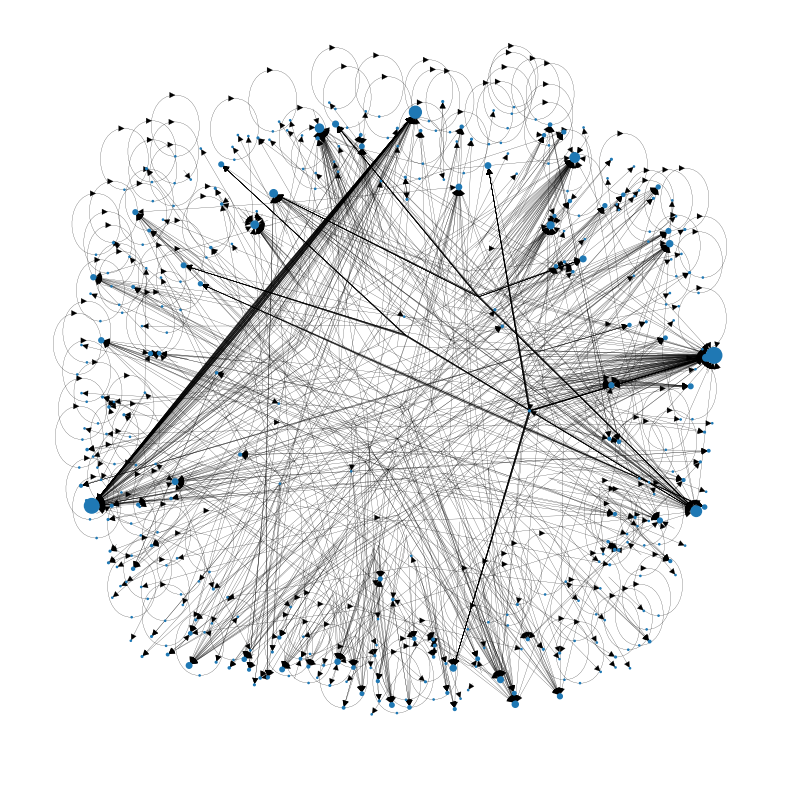

In [71]:
# Visualisasi in-degree centrality - NetworkX
node_size = [v * 1000 for v in in_degree_centrality.values()]
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(mention_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [72]:
# Visualisasi in-degree centrality - PyVis
nt = Network(height = "750px", width = "100%", directed = True)
MULTIPLIER_FACTOR = 100

# Pengubahan property size dan color harus dilakukan secara manual
for node in mention_net.nodes():
  nt.add_node(node, size=in_degree_centrality[node] * MULTIPLIER_FACTOR)

for source, target in mention_net.edges():
  nt.add_edge(source, target)

nt.show_buttons(filter_=['physics'])
nt.show('mention_net_in_deg_centrality.html')

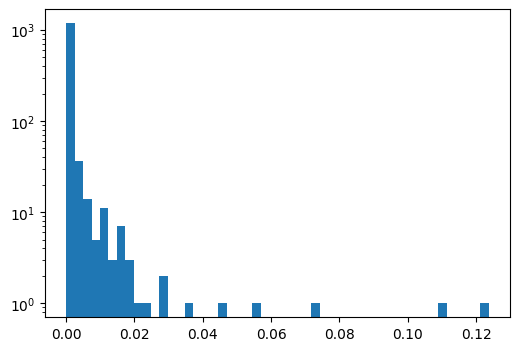

In [73]:
# In-Degree Distribution
plt.figure(figsize=(6, 4))
plt.hist(in_degree_centrality.values(), bins=50)
plt.yscale('log')

#### Out-Degree Centrality

In [74]:
# TODO: Cari top-10 account dengan out-degree centrality tertinggi
out_degree_centrality = nx.centrality.out_degree_centrality(mention_net)
sorted(out_degree_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('gorgeouschan', 0.01260835303388495),
 ('Redvelcake_', 0.011820330969267141),
 ('spaceeby', 0.011820330969267141),
 ('resaaaa_18', 0.01103230890464933),
 ('qiustuff', 0.009456264775413711),
 ('rotitawardouble', 0.009456264775413711),
 ('veeyaww', 0.007092198581560284),
 ('tmkoyaki', 0.007092198581560284),
 ('daisychain09', 0.007092198581560284),
 ('itszeeezz', 0.006304176516942475)]

(-1.193285014331341,
 1.079364385306835,
 -1.2012429131103026,
 1.1594171378693798)

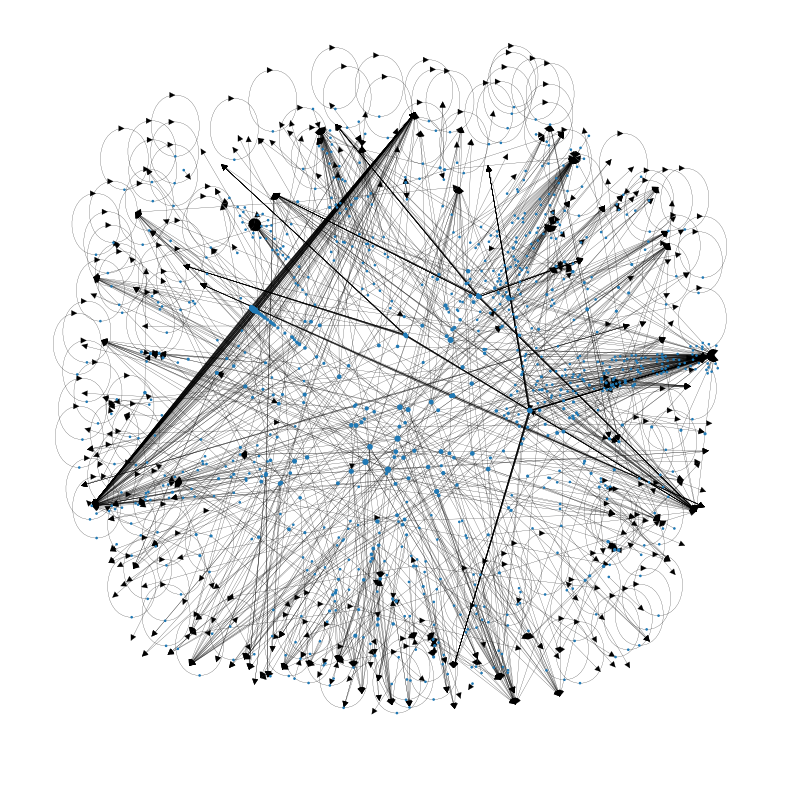

In [75]:
# TODO: Visualisasi out-degree centrality dengan NetworkX
node_size = [v * 1000 for v in out_degree_centrality.values()]
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(mention_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Eigenvector Centrality

In [76]:
# TODO: Cari top-10 account dengan eigenvector centrality tertinggi
eigenv_centrality = nx.centrality.eigenvector_centrality(mention_net)
sorted(eigenv_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('cutiesdrummer', 0.5773499269593694),
 ('duosinggit', 0.5773499269593693),
 ('manyunmelulu', 0.5773499269593693),
 ('Pelanggang', 0.0004949009122364118),
 ('azoreellaa', 0.0004949009122363072),
 ('KeysaDita2', 0.00037117568417732234),
 ('Fizah_Indah', 0.0003711756841772178),
 ('coznical', 0.00025777202215939506),
 ('adjusthings', 0.0002577608917898507),
 ('opiniums', 0.00025776089178969385)]

(-1.193285014331341,
 1.079364385306835,
 -1.2012429131103026,
 1.1594171378693798)

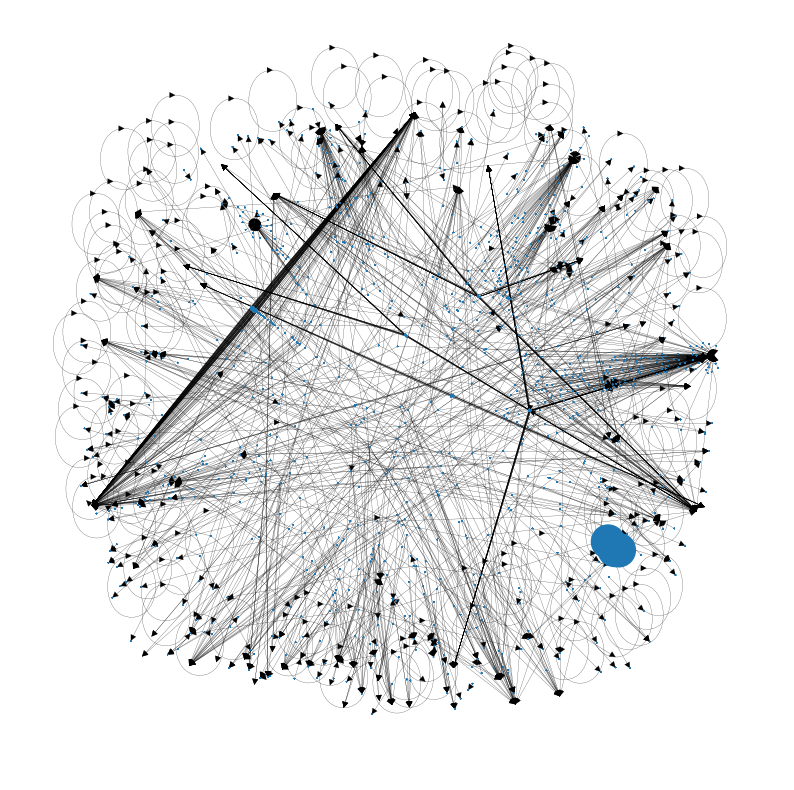

In [77]:
# TODO: Visualisasi eigenvector centrality dengan NetworkX
node_size = [v * 1000 for v in eigenv_centrality.values()]
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(mention_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Betweenness Centrality

In [80]:
# TODO: Cari top-10 account dengan betweenness centrality tertinggi
btwns_centrality = nx.centrality.betweenness_centrality(mention_net)
sorted(btwns_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('febrian_pepe', 8.638412222545386e-05),
 ('adjusthings', 7.768356315238656e-06),
 ('shopeesticated_', 7.457622062629109e-06),
 ('kinarration', 3.7288110313145547e-06),
 ('zahira_kalyna', 2.48587402087637e-06),
 ('INDA_B0Y', 1.8644055156572773e-06),
 ('tmkoyaki', 1.8644055156572773e-06),
 ('directolr', 1.8644055156572773e-06),
 ('siska_larass', 1.5536712630477313e-06),
 ('opiniums', 1.5536712630477313e-06)]

(-1.193285014331341,
 1.079364385306835,
 -1.2012429131103026,
 1.1594171378693798)

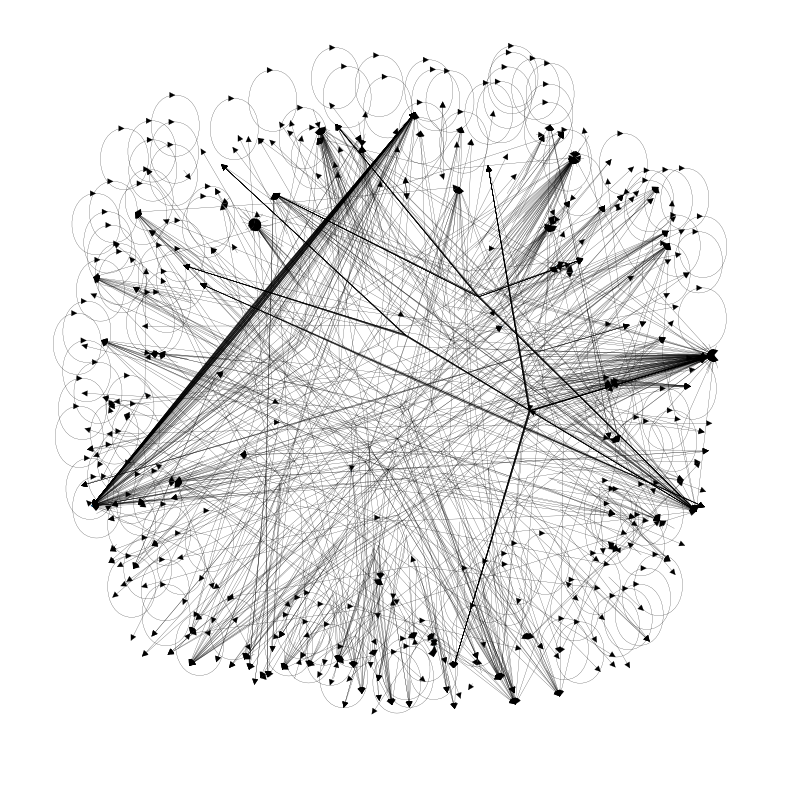

In [81]:
# TODO: Visualisasi betweenness centrality dengan NetworkX
node_size = [v * 1000 for v in btwns_centrality.values()]
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(mention_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Closeness Centrality

In [82]:
# TODO: Cari top-10 account dengan closeness centrality tertinggi
closeness_centrality = nx.centrality.closeness_centrality(mention_net)
sorted(closeness_centrality.items(), key = lambda item: item[1], reverse = True)[:10]

[('iyamrenzia', 0.12373904233293685),
 ('febrian_pepe', 0.1095350669818755),
 ('H451M90', 0.07328605200945626),
 ('Askrlfess', 0.05673758865248227),
 ('txtfromsoc', 0.05535925615236223),
 ('andriandinora_', 0.045705279747832936),
 ('anto_cahaya', 0.03467297084318361),
 ('snorlaxzs', 0.028368794326241134),
 ('angela_syahfira', 0.027580772261623327),
 ('ratnasari917', 0.02364066193853428)]

(-1.193285014331341,
 1.079364385306835,
 -1.2012429131103026,
 1.1594171378693798)

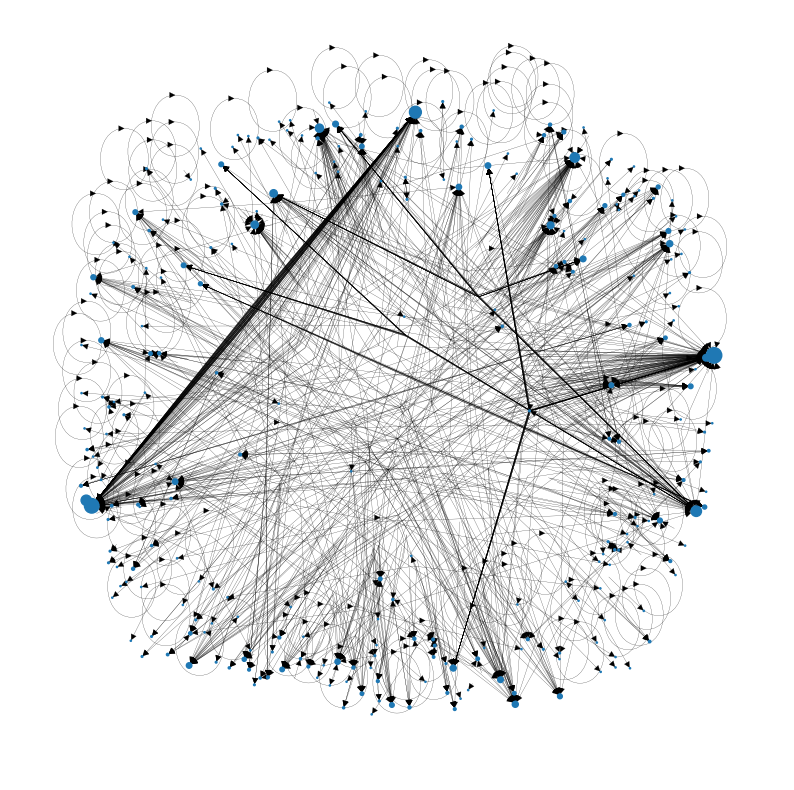

In [83]:
# TODO: Visualisasi closeness centrality dengan NetworkX
node_size = [v * 1000 for v in closeness_centrality.values()]
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize=(10, 10))
nx.draw_networkx(mention_net, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Community Detection

Dokumentasi: https://networkx.org/documentation/stable/reference/algorithms/community.html

### Greedy Modularity

In [84]:
nodes = {node: i for i, node in enumerate(mention_net.nodes())}
colors = ["" for x in range(mention_net.number_of_nodes())]

counter = 0
for com in nx.community.greedy_modularity_communities(mention_net):
    color = "#%06X" % random.randint(0, 0xFFFFFF)
    counter += 1
    for node in list(com):
        colors[nodes[node]] = color

print('Number of Community using Greedy Modularity: {}'.format(counter))

Number of Community using Greedy Modularity: 196


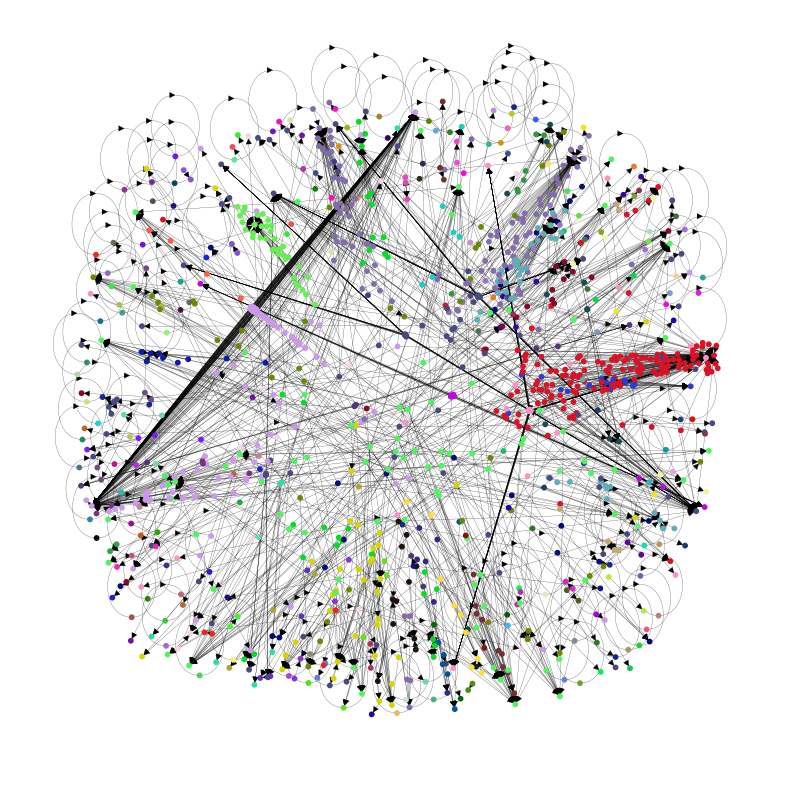

In [85]:
# Visualisasi community dengan NetworkX
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize = (10, 10))
plt.axis("off")
nx.draw_networkx(mention_net, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=colors)

### Louvain

In [86]:
! pip install python-louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [87]:
from community import community_louvain

In [101]:
# TODO: Cari jumlah community apabila menggunakan Louvain
G = mention_net.to_undirected()
partition = community_louvain.best_partition(G)

counter = 0
for i in partition:
  if partition[i] != 0:
    counter += 1

print('Number of Community using Label Propagation: {}'.format(counter))

Number of Community using Label Propagation: 1149


<ipython-input-89-da2518aedc20>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)


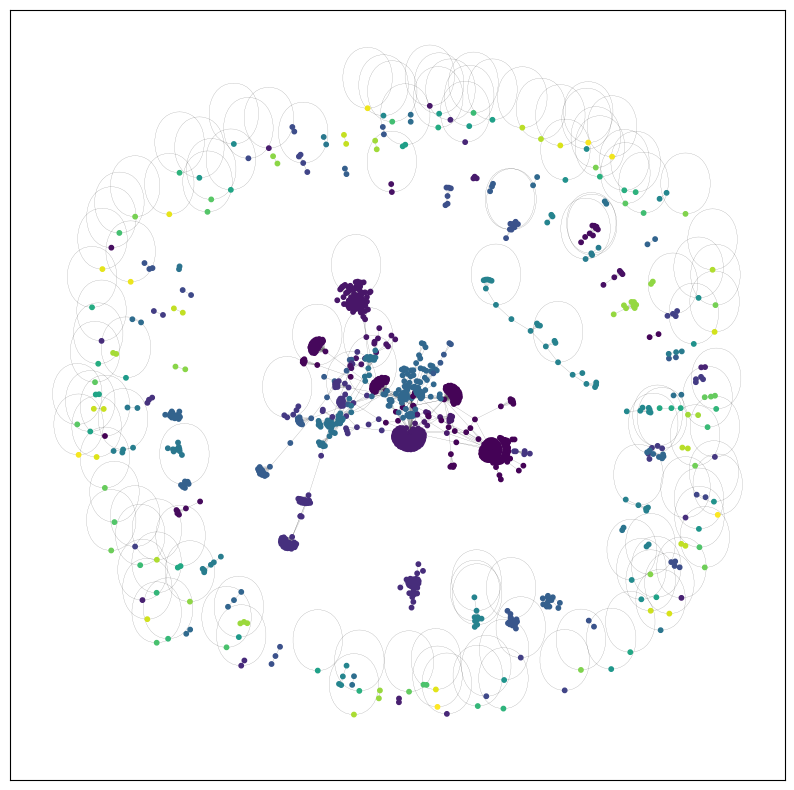

In [89]:
# TODO: Visualisasi community hasil Louvain dengan NetworkX
# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
plt.figure(figsize = (10, 10))
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=10,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5, width=0.15)
plt.show()


### Label Propagation

In [95]:
# TODO: Cari jumlah community apabila menggunakan Louvain
# Catatan: Algoritma label propagation tidak bisa diterapkan untuk directed graph
mention_net_undirected = mention_net.to_undirected()
nodes = {node: i for i, node in enumerate(mention_net_undirected)}
colors = ["" for x in range(mention_net.number_of_nodes())]

counter = 0
for com in nx.community.label_propagation_communities(mention_net_undirected):
    color = "#%06X" % random.randint(0, 0xFFFFFF)
    counter += 1
    for node in list(com):
        colors[nodes[node]] = color

print('Number of Community using Label Propagation: {}'.format(counter))

Number of Community using Label Propagation: 256


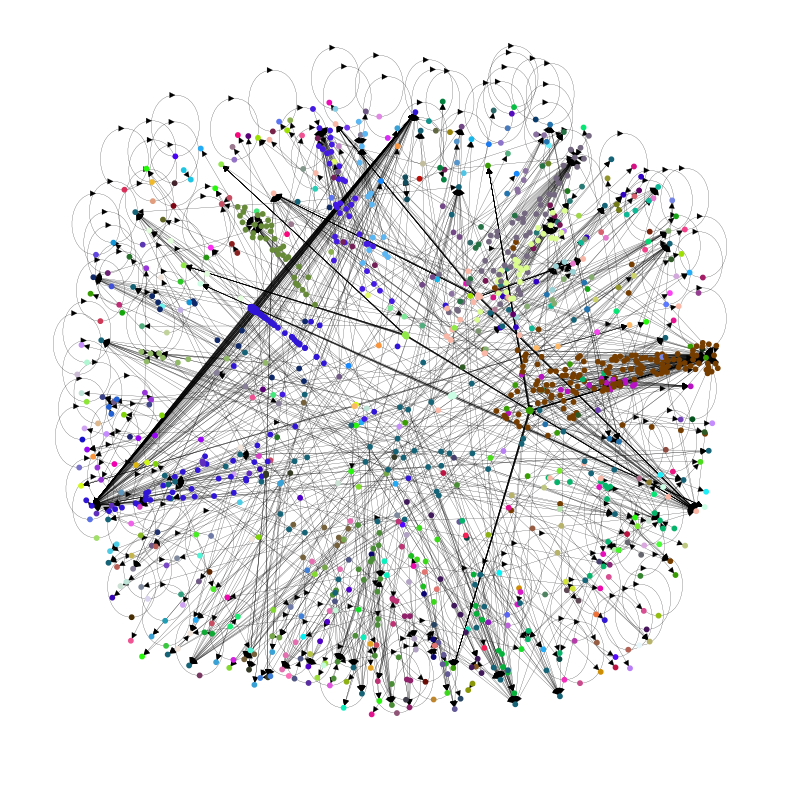

In [97]:
# TODO: Visualisasi community hasil Label Propagation dengan NetworkX

# Visualisasi community dengan NetworkX
pos = nx.spring_layout(mention_net, iterations=20, seed=0)
plt.figure(figsize = (10, 10))
plt.axis("off")
nx.draw_networkx(mention_net, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=colors)